In [31]:
# Bibliotecas ---

import pandas as pd
import numpy as np
import scipy as sp

# gráficos
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots


# Tratamento de audio

import librosa as lbs
import librosa.display as lbsd
import IPython

# IA
from sklearn import preprocessing, metrics
from sklearn.preprocessing import minmax_scale
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

In [22]:
dados = pd.read_excel('../recursos/misc/key_bpm.xlsx')
dados.head(1)

,Arquivo,Nome do Artista,Nome da Faixa,tecla
0,[Am] JoshWoodward-ImLettingGo-NoVox.wav,Josh Woodward,Im Letting Go,C


In [69]:
# Constantes ---
CMAP = 'plasma'
FONT_STYLE = dict(
        family="Times New Roman",
        size=12,
        color ='black'
    )

In [24]:
musicas = {}
k = 0
for i in range(len(dados)):
    sinal, sr = lbs.load(f'../recursos/audios/{dados["Arquivo"][i]}', sr = 22050)
    intervalo = 5 #segundos de musica por corte
    for n in range(int(np.floor(len(sinal)/(sr * intervalo)))-1):
        musica = {}
        musica['sinal'] = sinal[n * intervalo * sr:(n+1) * intervalo * sr]
        musica['sr'] = sr
        musica['tom'] = dados['tecla'][i]
        musicas[k] = musica
        k = k+1

len(musicas)


673

In [87]:
musica = musicas[22]
IPython.display.Audio(musica['sinal'], rate=musica['sr'] )

In [88]:
sinal = musica['sinal']
sr = musica['sr']

t = np.linspace(0,5,len(musica['sinal']))
fft = 2 * np.abs(sp.fft.fft(sinal, norm='forward'))
freq = sp.fft.fftfreq(len(sinal), d= 1/sr)
mascara = freq > 0
picos = sp.signal.find_peaks(fft[mascara])
max_picos = -np.sort(-fft[picos[0]])[0:5]
id_max_picos = []
for i in range(len(max_picos)):
    id_max_picos.append(np.where(fft[mascara] == max_picos[i])[0][0])

max_picos = np.sort(fft[mascara][picos[0]])[-6:-1]
max_picos = -np.sort(-fft[mascara][picos[0]])[0:5]
id_max_picos = []
for i in range(len(max_picos)):
    id_max_picos.append(np.where(fft == max_picos[i])[0][0])


In [89]:
fig = make_subplots(
    rows=2, 
    subplot_titles=[
        'Sinal no domínio do tempo', 
        'Sinal no domínio da frequência'
    ])

fig.add_trace(
    go.Scatter(
        x=t, 
        y=musica['sinal'], 
        mode = 'lines', 
        showlegend= False),
    col=1, 
    row=1)
fig.update_xaxes(title_text='tempo (s)',col=1, row=1)

fig.add_trace(
    go.Scatter(
        x=freq[mascara],
        y=fft[mascara],
        mode = 'lines',
        showlegend= False),
    col=1,
    row=2)
fig.update_xaxes(title_text='frequência (Hz)',col=1, row=2)
fig.update_layout(
    height=575, 
    width=1150,
      font=FONT_STYLE)

In [90]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=freq[mascara], y=fft[mascara], mode = 'lines'))
fig.add_trace(go.Scatter(x=freq[id_max_picos], y=fft[id_max_picos], mode ='markers'))

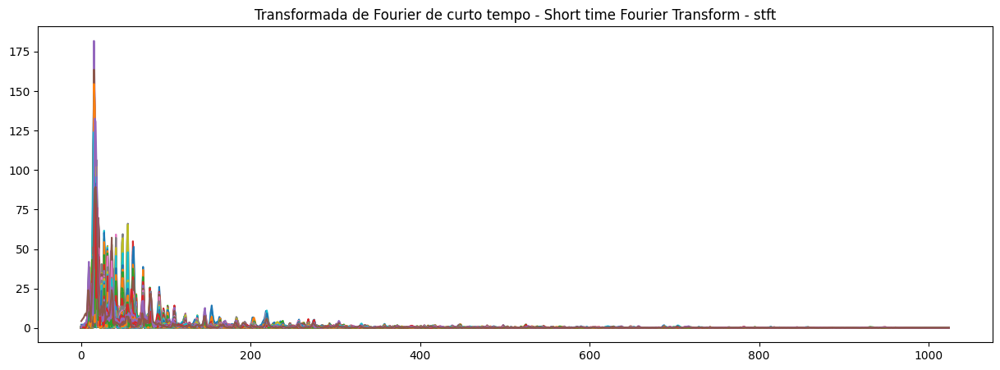

In [97]:

n_fft = 2048
hop_length = 512
D = np.abs(lbs.stft(musica['sinal'], n_fft = n_fft, hop_length = hop_length))
D2 = np.abs(lbs.stft(musica['sinal'], n_fft = n_fft * 8, hop_length = hop_length))
plt.figure(figsize = (15, 5))
plt.plot(D)
plt.title('Transformada de Fourier de curto tempo - Short time Fourier Transform - stft')
plt.show()

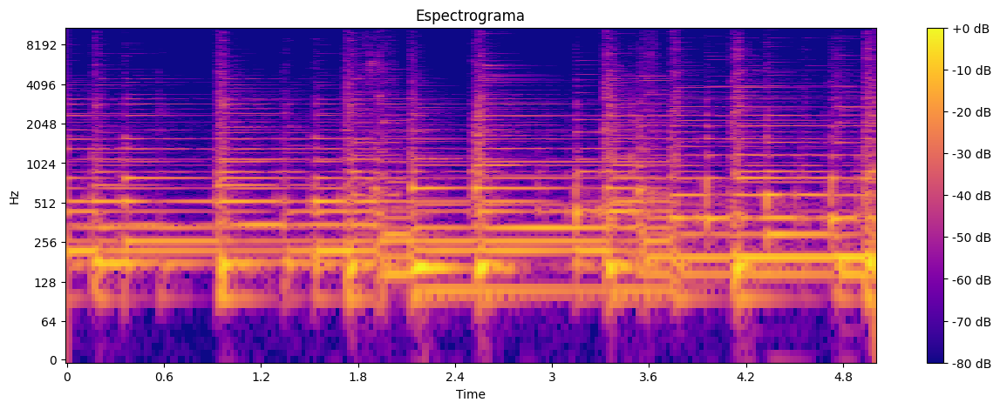

In [98]:
DB = lbs.amplitude_to_db(D, ref = np.max)
fig, ax = plt.subplots(1, 1, figsize = (15, 5))
img = lbsd.specshow(
    DB,
    sr = sr,
    hop_length = hop_length,
    x_axis = 'time',
    y_axis = 'log',
    cmap = CMAP,
    ax=ax)
plt.title('Espectrograma')
fig.colorbar(img, ax=ax, format="%+2.0f dB")
plt.show()

/tmp/ipykernel_4540/3229411638.py:13: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



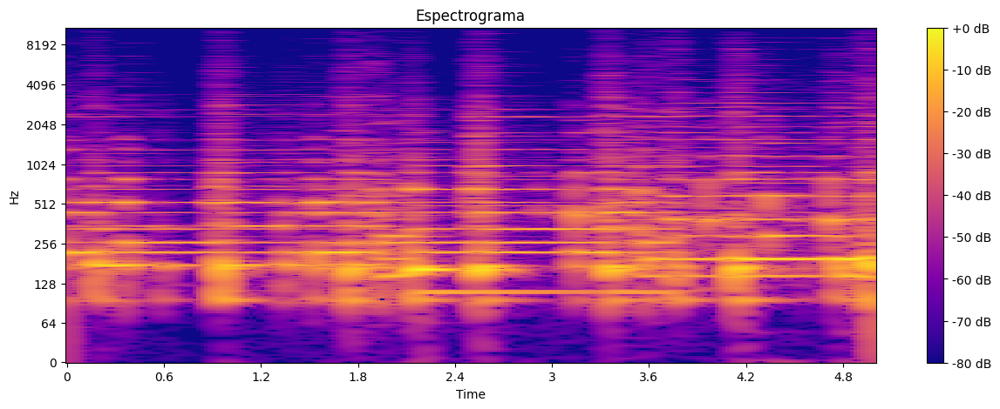

In [96]:
DB_2 = lbs.amplitude_to_db(D2, ref = np.max)
fig, ax = plt.subplots(1, 1, figsize = (15, 5))
img2 = lbsd.specshow(
    DB_2,
    sr = sr,
    hop_length = hop_length,
    x_axis = 'time',
    y_axis = 'log',
    cmap = CMAP,
    ax=ax)
fig.colorbar(img2, ax = ax, format="%+2.0f dB")
plt.title('Espectrograma')
fig.show()

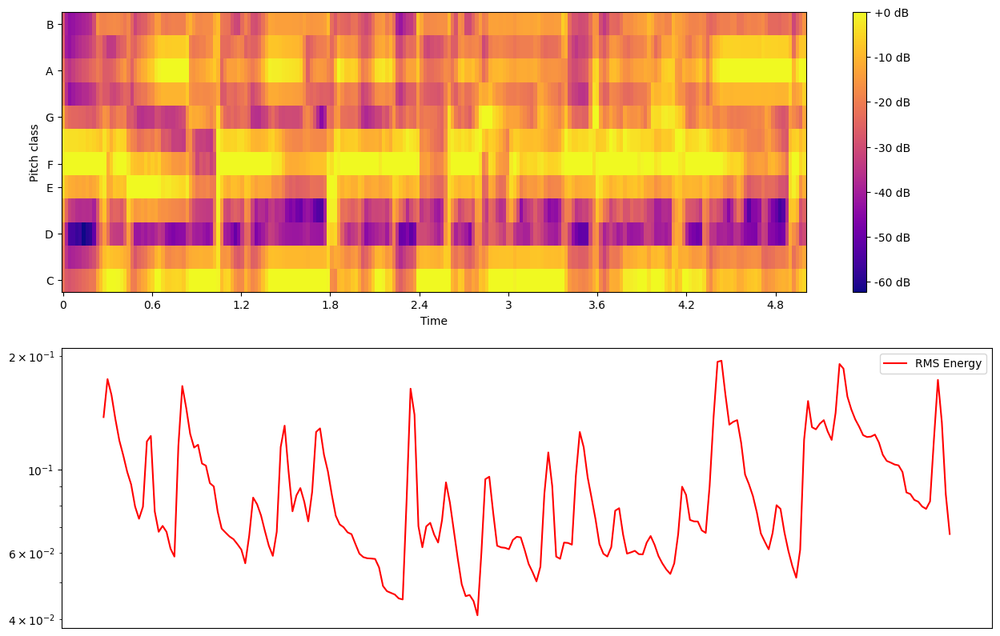

In [72]:
S, phase = lbs.magphase(D)
rms = lbs.feature.rms(S=S)
rms.shape

chroma_stft = lbs.feature.chroma_stft(y = musica['sinal'], sr=musica['sr'], hop_length=hop_length)
DB_chroma = lbs.amplitude_to_db(chroma_stft, ref = np.max)

fig, ax = plt.subplots(nrows=2, figsize = (15, 10))
img = lbsd.specshow(DB_chroma, sr = musica['sr'], hop_length = hop_length, x_axis = 'time', y_axis = 'chroma', cmap = CMAP, ax=ax[0])
fig.colorbar(img, ax=ax[0], format="%+2.0f dB")
#ax[0].title('Spectrogram')
times = lbs.times_like(rms)
ax[1].semilogy(times, rms[0],label='RMS Energy', color = 'red')
ax[1].set(xticks=[])
ax[1].legend()
ax[1].label_outer()
plt.show()

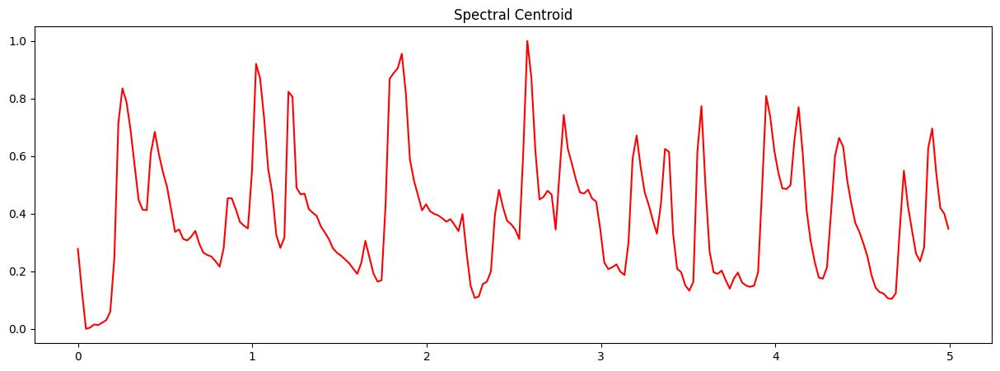

In [40]:
spectral_centroids = lbs.feature.spectral_centroid(y=musica['sinal'], sr=musica['sr'])
plt.figure(figsize=(15, 5))
frames = range(len(spectral_centroids[0]))
t = lbs.frames_to_time(frames)
#lbs.display.waveplot(signal, sr=sr, alpha=0.4)
plt.plot(t, minmax_scale(spectral_centroids[0],axis=0), color='r')
plt.title('Spectral Centroid')
plt.show()

In [9]:
n_fft = 2048
hop_length = 512
db = {'tom': [],
      'rms mean': [],
      'rms std': [],
      'rms qnt 10': [],
      'rms qnt 25': [],
      'rms qnt 75': [],
      'rms qnt 90': [],
      'rms median': [],
      'freq1': [],
      'freq2': [],
      'freq3': [],
      'freq4': [],
      'freq5': [],
      'chroma mean': [],
      'chroma std': [],
      'spectral centroids mean': [],
      'spectral centroids std': []}
for i in range(len(musicas)):
      musica = musicas[i]

      fft = 2 * np.abs(sp.fft.fft(musica['sinal'], norm='forward'))
      freq = sp.fft.fftfreq(len(musica['sinal']), d= 1/musica['sr'])
      mascara = freq > 0
      picos = sp.signal.find_peaks(fft[mascara])
      max_picos = -np.sort(-fft[picos[0]])[0:5]
      id_max_picos = []

      for n in range(len(max_picos)):
            id_max_picos.append(np.where(fft[mascara] == max_picos[n])[0][0])
      
      stft = np.abs(lbs.stft(musica['sinal'], n_fft = n_fft, hop_length = hop_length))
      S, phase = lbs.magphase(stft)
      rms = lbs.feature.rms(S=S)
      chroma_stft = lbs.feature.chroma_stft(y = musica['sinal'], sr=musica['sr'], hop_length=hop_length)
      spectral_centroids = lbs.feature.spectral_centroid(y=musica['sinal'], sr=musica['sr'])

      db['tom'].append(musica['tom'])

      db['freq1'].append(freq[id_max_picos[0]])
      db['freq2'].append(freq[id_max_picos[1]])
      db['freq3'].append(freq[id_max_picos[2]])
      db['freq4'].append(freq[id_max_picos[3]])
      db['freq5'].append(freq[id_max_picos[4]])

      db['rms mean'].append(np.mean(rms))
      db['rms std'].append(np.std(rms))
      db['rms qnt 10'].append(np.quantile(rms, 0.10))
      db['rms qnt 25'].append(np.quantile(rms, 0.25))
      db['rms qnt 75'].append(np.quantile(rms, 0.75))
      db['rms qnt 90'].append(np.quantile(rms, 0.90))
      db['rms median'].append(np.median(rms))

      db['chroma mean'].append(np.mean(chroma_stft))
      db['chroma std'].append(np.std(chroma_stft))

      db['spectral centroids mean'].append(np.mean(spectral_centroids))
      db['spectral centroids std'].append(np.std(spectral_centroids))

df=pd.DataFrame(db)


In [13]:
df.head()

,tom,rms mean,rms std,rms qnt 10,rms qnt 25,rms qnt 75,rms qnt 90,rms median,freq1,freq2,freq3,freq4,freq5,chroma mean,chroma std,spectral centroids mean,spectral centroids std
0,C,0.035912,0.026186,0.017494,0.022950,0.037207,0.064436,0.029921,176.2,175.6,174.6,219.2,174.0,0.264369,0.306275,841.821852,470.870397
1,C,0.042208,0.020667,0.017677,0.026464,0.055238,0.067306,0.038329,220.4,177.2,219.0,110.0,109.6,0.282550,0.299476,703.996916,268.459785
2,C,0.029290,0.011681,0.016824,0.020549,0.034236,0.042394,0.028760,176.2,219.6,177.0,175.2,261.6,0.301277,0.298482,821.612928,303.241156
3,C,0.035906,0.020730,0.016860,0.022781,0.043286,0.061152,0.029758,194.8,166.4,168.8,164.0,173.4,0.293105,0.296345,795.667916,288.478015
4,C,0.035812,0.019939,0.016883,0.022364,0.041927,0.063763,0.029403,177.2,175.2,174.8,220.0,175.6,0.275509,0.299880,760.715016,320.271474


In [10]:
y = df['tom']
X = df.loc[:, df.columns != 'tom']
cols = X.columns
min_max_scaler = preprocessing.MinMaxScaler()
np_scaled = min_max_scaler.fit_transform(X)
X = pd.DataFrame(np_scaled, columns = cols)

In [11]:
X_train, X_test, y_train, y_test = train_test_split(X, y)

In [13]:
model = RandomForestClassifier(n_estimators=3500, max_depth=24, random_state=0)
model.fit(X_train, y_train)

RandomForestClassifier(max_depth=24, n_estimators=3500, random_state=0)

In [14]:
preds = model.predict(X_test)
print(f'Accuracy: {np.round(accuracy_score(y_test, preds), 4) * 100}%')

Accuracy: 87.57000000000001%


In [12]:
X_test

,rms mean,rms std,rms qnt 10,rms qnt 25,rms qnt 75,rms qnt 90,rms median,freq1,freq2,freq3,freq4,freq5,chroma mean,chroma std,spectral centroids mean,spectral centroids std
119,0.725940,0.728385,0.426885,0.562487,0.843648,0.786224,0.736870,0.010943,0.007489,0.019502,0.008907,0.006453,0.543096,0.630902,0.283894,0.214120
488,0.301300,0.396528,0.221468,0.237346,0.303994,0.370281,0.251344,0.054203,0.056337,0.049984,0.027017,0.043810,0.182949,0.713343,0.146960,0.197614
384,0.203963,0.286624,0.126390,0.143637,0.226345,0.276612,0.173014,0.080713,0.030207,0.062766,0.032293,0.046652,0.076645,0.733779,0.129074,0.121890
102,0.435201,0.416603,0.392730,0.395770,0.418134,0.394516,0.398790,0.125051,0.020138,0.157325,0.027819,0.056391,0.231584,0.741327,0.289423,0.229898
435,0.414750,0.337846,0.340743,0.384541,0.428021,0.404266,0.392678,0.020345,0.039694,0.046542,0.029339,0.027322,0.201551,0.805832,0.100495,0.031935
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
404,0.316917,0.542497,0.127583,0.197515,0.392441,0.412375,0.271495,0.057645,0.045685,0.081695,0.017181,0.020099,0.125327,0.807165,0.131949,0.556792
530,0.539981,0.300083,0.509450,0.522661,0.546390,0.501775,0.522226,0.018958,0.022427,0.017371,0.024062,0.003019,0.418148,0.675087,0.376989,0.181449
472,0.265106,0.276801,0.207700,0.222563,0.277224,0.304758,0.231665,0.047318,0.037489,0.100459,0.058508,0.015304,0.185536,0.796689,0.152167,0.244085
35,0.367225,0.425053,0.242497,0.297244,0.419759,0.444561,0.329181,0.035861,0.064159,0.129794,0.103255,0.023977,0.129168,0.737998,0.140428,0.120399


In [17]:
import joblib
scaler = min_max_scaler.fit(X)
model_file = 'identificador_de_tom_modelo.gz'
scaler_file = 'identificador_de_tom_fit.gz'
# salva o modelo no disco
joblib.dump(model, model_file)
joblib.dump(scaler, scaler_file)


['identificador_de_tom_fit.gz']

In [27]:
my_scaler = joblib.load(scaler_file)
teste = my_scaler.transform(X)

print(teste)
print(np_scaled)

[[0.17620246 0.35008665 0.10636349 ... 0.80739393 0.12319338 0.25649076]
 [0.20709388 0.27629821 0.10747484 ... 0.77573656 0.09675313 0.13194763]
 [0.14370766 0.15616212 0.10228514 ... 0.77110792 0.11931651 0.15334859]
 ...
 [0.79286323 0.41623904 0.8035548  ... 0.66105594 0.3256025  0.15164106]
 [0.63844607 0.47521592 0.61063747 ... 0.69031718 0.3158303  0.18891723]
 [0.18306541 0.31684044 0.10656475 ... 0.71190394 0.15825995 0.18802163]]
[[0.17620246 0.35008665 0.10636349 ... 0.80739393 0.12319338 0.25649076]
 [0.20709388 0.27629821 0.10747484 ... 0.77573656 0.09675313 0.13194763]
 [0.14370766 0.15616212 0.10228514 ... 0.77110792 0.11931651 0.15334859]
 ...
 [0.79286323 0.41623904 0.8035548  ... 0.66105594 0.3256025  0.15164106]
 [0.63844607 0.47521592 0.61063747 ... 0.69031718 0.3158303  0.18891723]
 [0.18306541 0.31684044 0.10656475 ... 0.71190394 0.15825995 0.18802163]]


In [26]:
teste==np_scaled

array([[ True, False,  True, ...,  True,  True,  True],
       [ True, False,  True, ...,  True,  True,  True],
       [ True, False,  True, ...,  True,  True,  True],
       ...,
       [ True, False,  True, ...,  True,  True,  True],
       [ True, False,  True, ...,  True,  True,  True],
       [ True, False,  True, ...,  True,  True,  True]])

In [18]:
musica = musicas[32]
x = sp.fft.next_fast_len(2 * len(musica['sinal']))
x

220500

In [20]:
print(x/ len(musica['sinal']))

2.0
